<a href="https://colab.research.google.com/github/erisa03/computer-vision/blob/main/Exercise1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<ipython-input-5-af83d860c42a>:4: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(I) # visualize image using imshow function
<ipython-input-5-af83d860c42a>:5: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


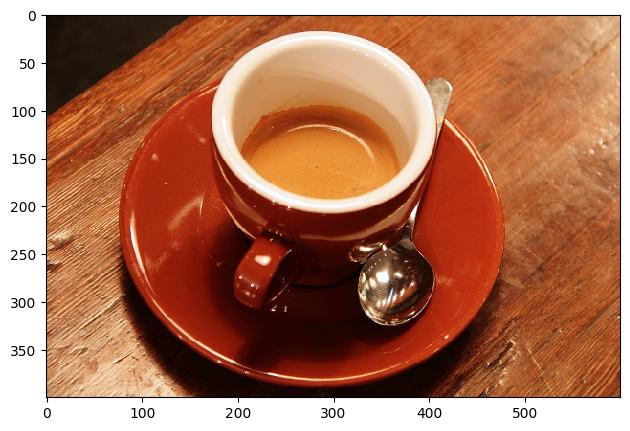

In [5]:
import skimage as sk # load skimage libraries

I = sk.data.coffee()
sk.io.imshow(I) # visualize image using imshow function
sk.io.show()

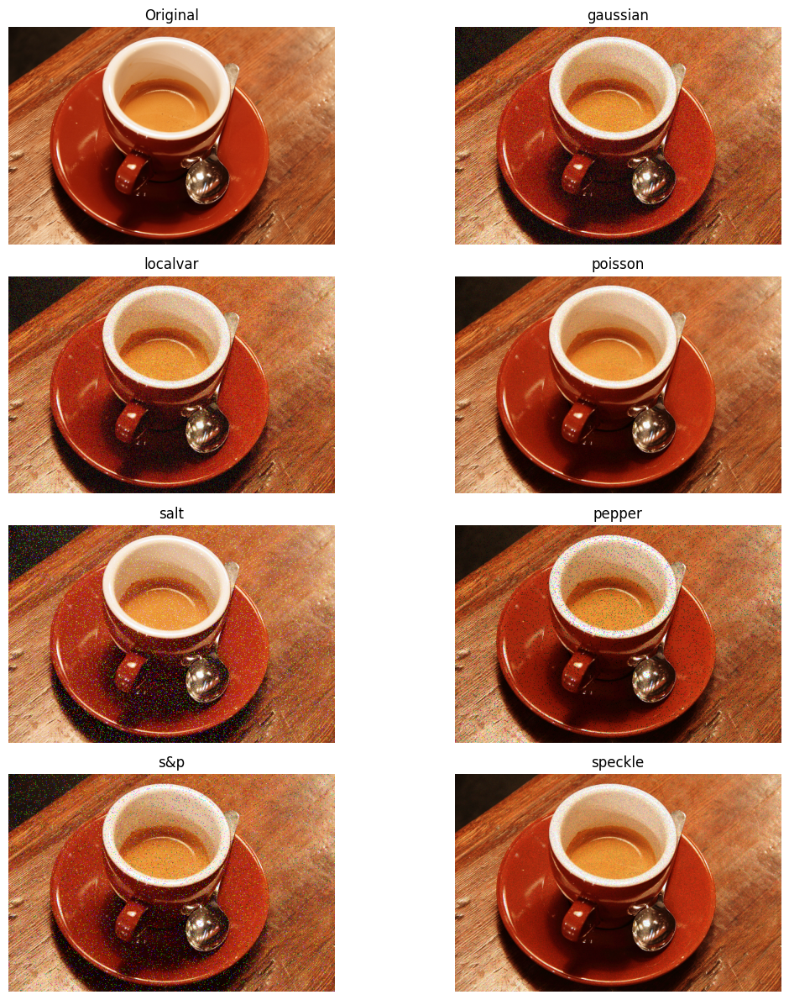

In [9]:
import skimage as sk
from skimage import data, util
import matplotlib.pyplot as plt
import numpy as np

# Load the image
image = data.coffee()

# Define noise types
noise_types = ['gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', 'speckle']

# Generate noisy images
noisy_images = [util.random_noise(image, mode=noise) for noise in noise_types]

# Plot original + noisy images in a 4x2 grid
fig, axes = plt.subplots(4, 2, figsize=(12, 12))
axes = axes.ravel()

# Original image
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis('off')

# Noisy images
for i in range(7):
    axes[i + 1].imshow(noisy_images[i])
    axes[i + 1].set_title(noise_types[i])
    axes[i + 1].axis('off')

plt.tight_layout()
plt.show()


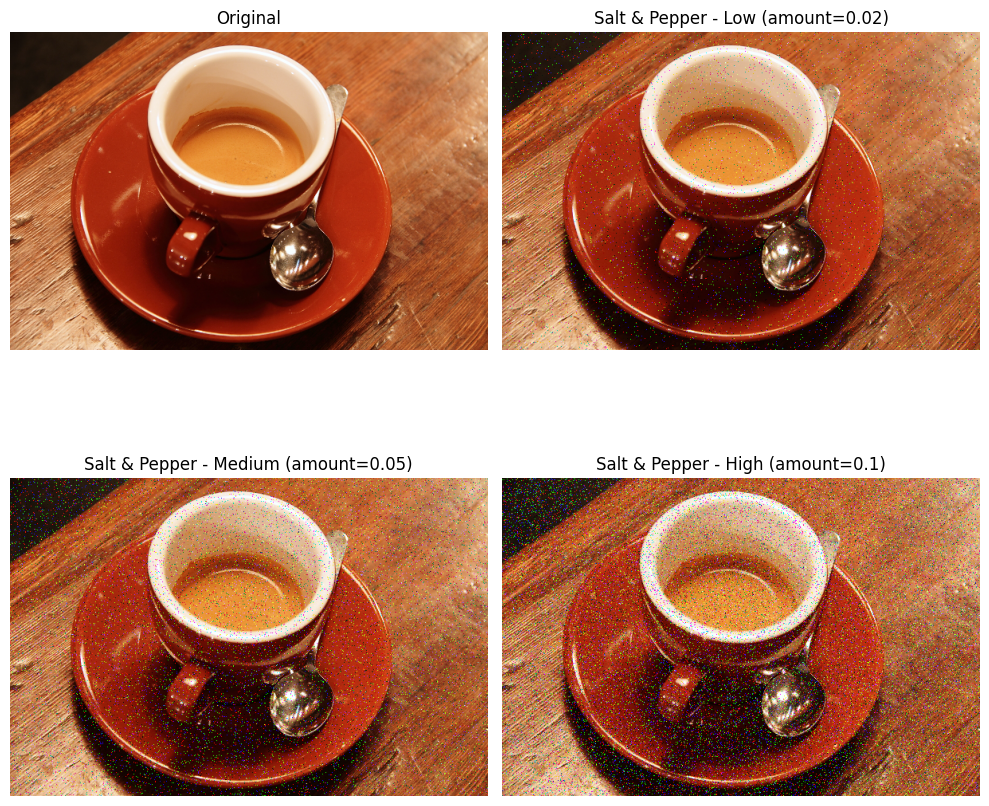

In [11]:
import matplotlib.pyplot as plt
from skimage import util, data

# Load original image
image = data.coffee()

# Generate 3 different noise levels (amount = noise intensity)
noisy_low = util.random_noise(image, mode='s&p', amount=0.02)
noisy_med = util.random_noise(image, mode='s&p', amount=0.05)
noisy_high = util.random_noise(image, mode='s&p', amount=0.1)

# Plot original and noisy images in a 2x2 figure
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.ravel()

axes[0].imshow(image)
axes[0].set_title("Original")
axes[1].imshow(noisy_low)
axes[1].set_title("Salt & Pepper - Low (amount=0.02)")
axes[2].imshow(noisy_med)
axes[2].set_title("Salt & Pepper - Medium (amount=0.05)")
axes[3].imshow(noisy_high)
axes[3].set_title("Salt & Pepper - High (amount=0.1)")

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()


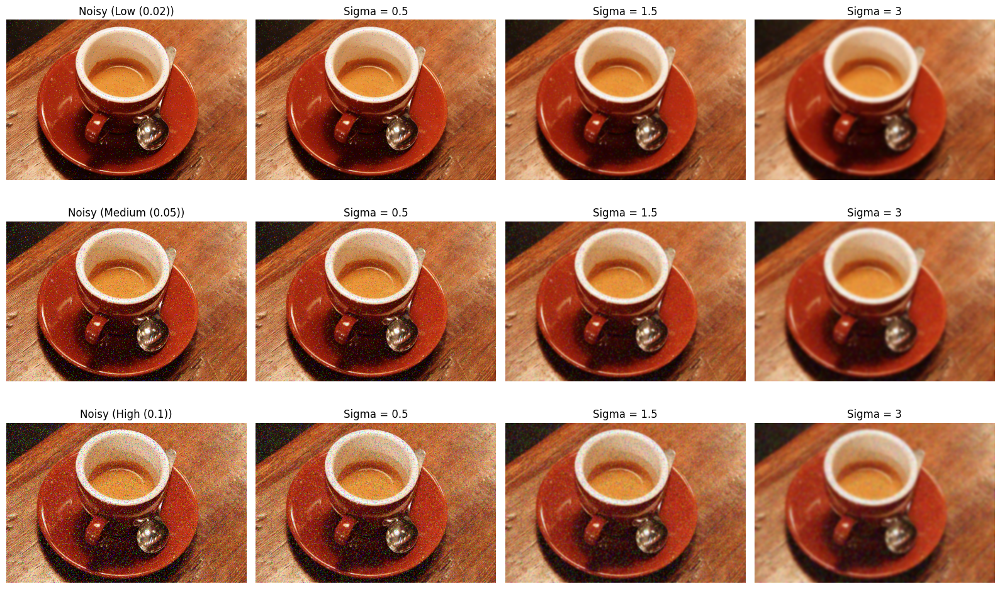

In [12]:
from skimage.filters import gaussian
import matplotlib.pyplot as plt
from skimage import util, data

# Original image and S&P noisy versions
image = data.coffee()
noisy_images = [
    util.random_noise(image, mode='s&p', amount=0.02),
    util.random_noise(image, mode='s&p', amount=0.05),
    util.random_noise(image, mode='s&p', amount=0.1)
]
noise_labels = ['Low (0.02)', 'Medium (0.05)', 'High (0.1)']

# Sigma values to test
sigmas = [0.5, 1.5, 3]

# Plot each noisy image with different Gaussian sigma values
fig, axes = plt.subplots(3, 4, figsize=(16, 10))
for i in range(3):
    # First column: original noisy image
    axes[i, 0].imshow(noisy_images[i])
    axes[i, 0].set_title(f"Noisy ({noise_labels[i]})")
    axes[i, 0].axis('off')

    # Apply Gaussian filter with different sigmas
    for j, sigma in enumerate(sigmas):
        denoised = gaussian(noisy_images[i], sigma=sigma, channel_axis=-1)
        axes[i, j+1].imshow(denoised)
        axes[i, j+1].set_title(f"Sigma = {sigma}")
        axes[i, j+1].axis('off')

plt.tight_layout()
plt.show()


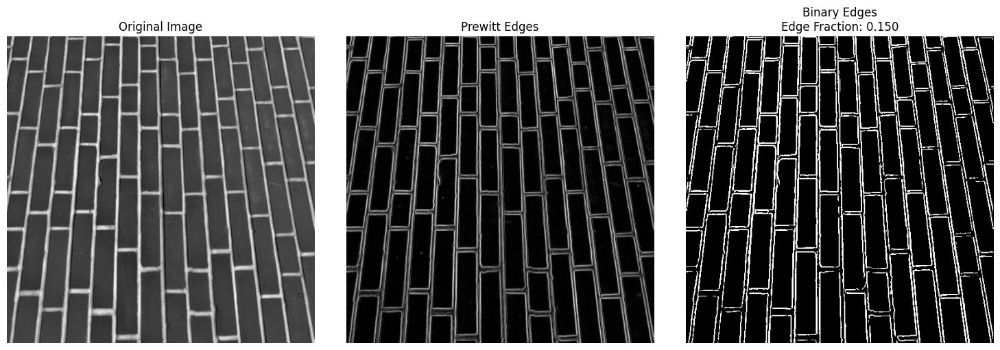

Fraction of image corresponding to edges: 0.150
Fraction of image corresponding to bricks: 0.850


In [18]:
from skimage import data, filters
import matplotlib.pyplot as plt
import numpy as np

# Load the built-in 'brick' image (already grayscale)
bricks = data.brick()

# Apply Prewitt edge detection directly
edges = filters.prewitt(bricks)

# Threshold the edge image to get binary edge map
threshold = 0.1  # Adjustable threshold
binary_edges = edges > threshold

# Compute fractions
total_pixels = binary_edges.size
edge_pixels = np.sum(binary_edges)
edge_fraction = edge_pixels / total_pixels
brick_fraction = 1 - edge_fraction

# Plot results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(bricks, cmap='gray')
axes[0].set_title("Original Image")
axes[1].imshow(edges, cmap='gray')
axes[1].set_title("Prewitt Edges")
axes[2].imshow(binary_edges, cmap='gray')
axes[2].set_title(f"Binary Edges\nEdge Fraction: {edge_fraction:.3f}")

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

# Print numeric output
print(f"Fraction of image corresponding to edges: {edge_fraction:.3f}")
print(f"Fraction of image corresponding to bricks: {brick_fraction:.3f}")


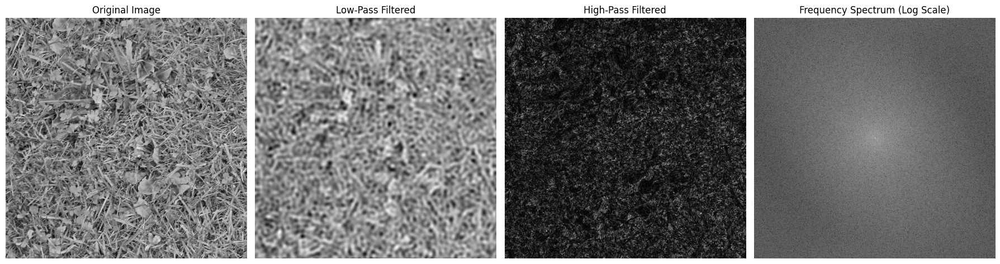

In [24]:
from skimage import data
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft2, fftshift, ifft2, ifftshift

# Load grayscale 'grass' image (already grayscale)
image = data.grass()

# Compute FFT and shift zero frequency to center
f = fft2(image)
fshift = fftshift(f)

# Get image dimensions and create frequency mask
rows, cols = image.shape
crow, ccol = rows // 2 , cols // 2

# Create low-pass and high-pass masks
radius = 50  # Radius of circular mask

low_pass_mask = np.zeros_like(image)
Y, X = np.ogrid[:rows, :cols]
mask_area = (X - ccol)**2 + (Y - crow)**2 <= radius**2
low_pass_mask[mask_area] = 1

# High-pass mask is the inverse
high_pass_mask = 1 - low_pass_mask

# Apply masks in frequency domain
f_low = fshift * low_pass_mask
f_high = fshift * high_pass_mask

# Inverse FFT to return to spatial domain
img_low = np.abs(ifft2(ifftshift(f_low)))
img_high = np.abs(ifft2(ifftshift(f_high)))

# Plotting
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title("Original Image")
axes[1].imshow(img_low, cmap='gray')
axes[1].set_title("Low-Pass Filtered")
axes[2].imshow(img_high, cmap='gray')
axes[2].set_title("High-Pass Filtered")
axes[3].imshow(np.log(1 + np.abs(fshift)), cmap='gray')
axes[3].set_title("Frequency Spectrum (Log Scale)")

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()


Number of erosions needed to remove all blobs: 16


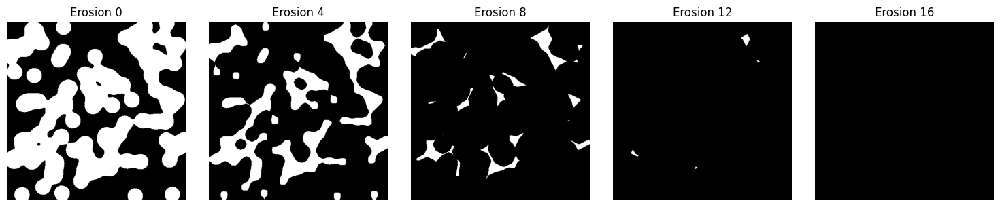

In [26]:
from skimage.data import binary_blobs
from skimage.morphology import erosion, disk
import matplotlib.pyplot as plt
import numpy as np

# Generate binary blobs
blobs = binary_blobs(length=512, blob_size_fraction=0.1, volume_fraction=0.5, rng=42)

# Structuring element: disk of radius 3
selem = disk(3)

# Track number of erosions
eroded = blobs.copy()
erosion_count = 0
erosion_images = [eroded.copy()]  # store images for plotting

# Keep eroding until the image is fully zero
while np.any(eroded):
    eroded = erosion(eroded, selem)
    erosion_count += 1
    erosion_images.append(eroded.copy())

print(f"Number of erosions needed to remove all blobs: {erosion_count}")

# Plot initial and final images + some intermediate ones
fig, axes = plt.subplots(1, min(5, len(erosion_images)), figsize=(15, 3))

for i, ax in enumerate(axes):
    step = i * max(1, erosion_count // (len(axes)-1))  # even spacing
    ax.imshow(erosion_images[step], cmap='gray')
    ax.set_title(f"Erosion {step}")
    ax.axis('off')

plt.tight_layout()
plt.show()
